In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.models as models
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, accuracy_score
import matplotlib.pyplot as plt
import numpy as np
import time
from collections import Counter

Učitavanje i pregled izabranog skupa podataka

Broj slika u train skupu: 3680
Broj slika u test skupu: 3669
Broj klasa: 37

Broj primera po klasama u train skupu:
Abyssinian: 100
American Bulldog: 100
American Pit Bull Terrier: 100
Basset Hound: 100
Beagle: 100
Bengal: 100
Birman: 100
Bombay: 96
Boxer: 100
British Shorthair: 100
Chihuahua: 100
Egyptian Mau: 93
English Cocker Spaniel: 96
English Setter: 100
German Shorthaired: 100
Great Pyrenees: 100
Havanese: 100
Japanese Chin: 100
Keeshond: 100
Leonberger: 100
Maine Coon: 100
Miniature Pinscher: 100
Newfoundland: 96
Persian: 100
Pomeranian: 100
Pug: 100
Ragdoll: 100
Russian Blue: 100
Saint Bernard: 100
Samoyed: 100
Scottish Terrier: 100
Shiba Inu: 100
Siamese: 99
Sphynx: 100
Staffordshire Bull Terrier: 100
Wheaten Terrier: 100
Yorkshire Terrier: 100

Broj primera po klasama u test skupu:
Abyssinian: 98
American Bulldog: 100
American Pit Bull Terrier: 100
Basset Hound: 100
Beagle: 100
Bengal: 100
Birman: 100
Bombay: 88
Boxer: 99
British Shorthair: 100
Chihuahua: 100
Egyptian Mau: 9

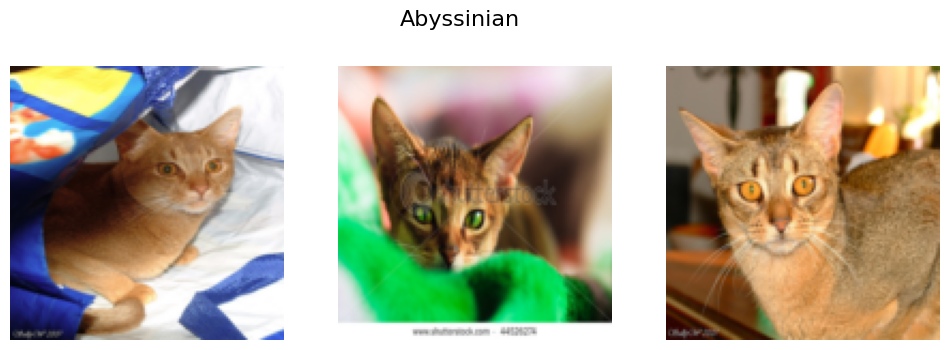

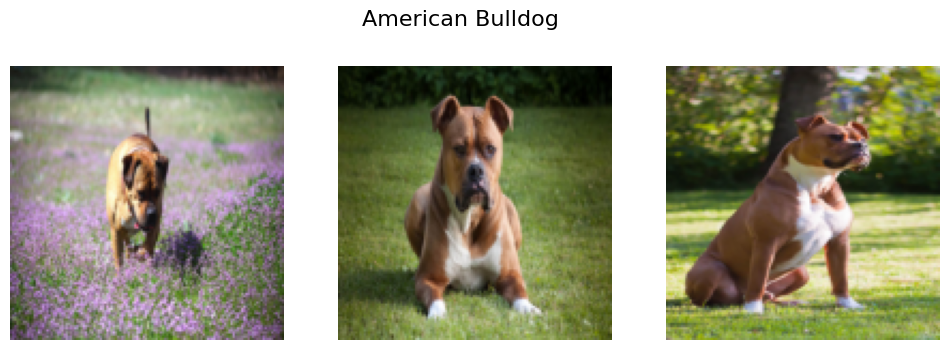

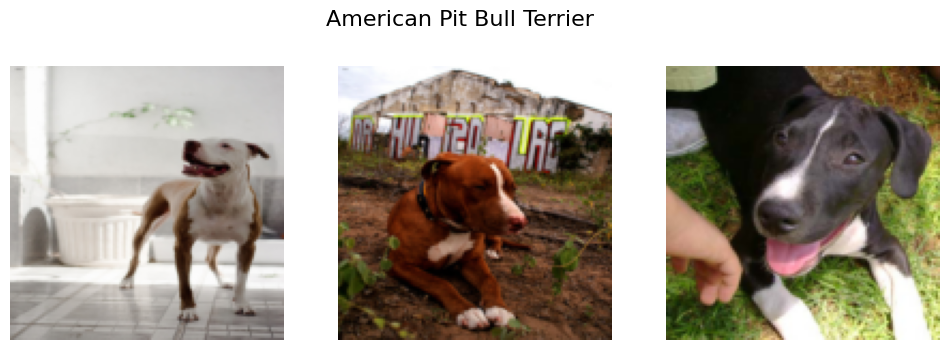

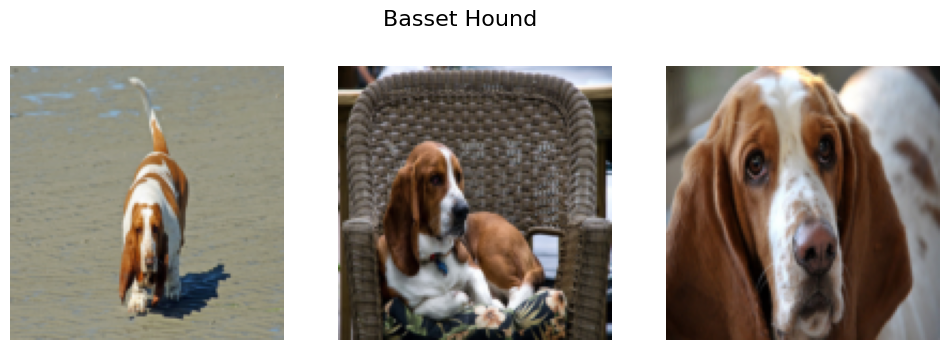

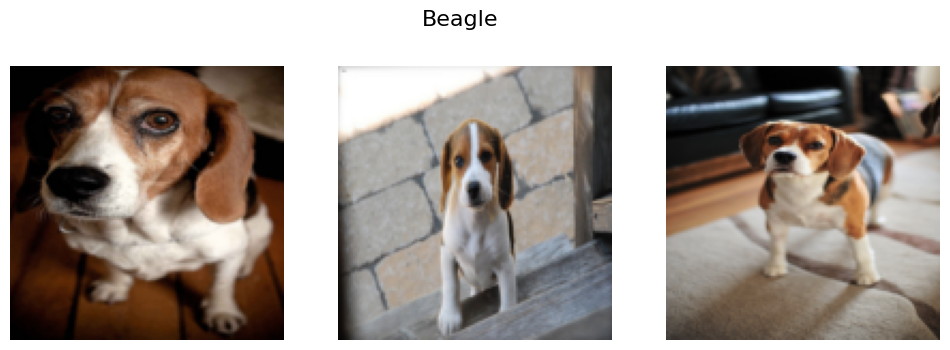

...

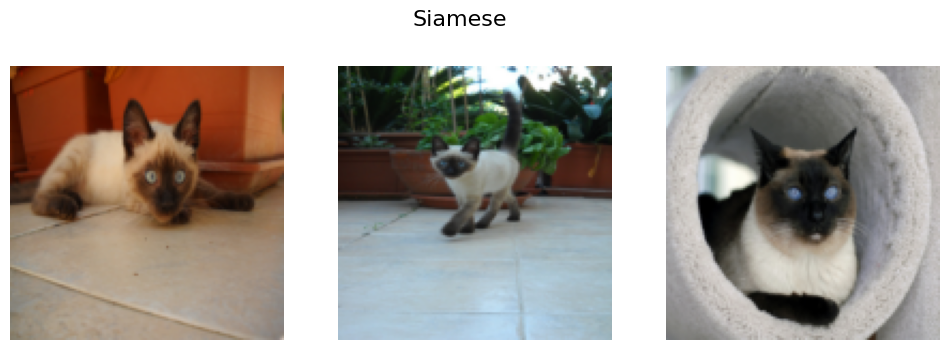

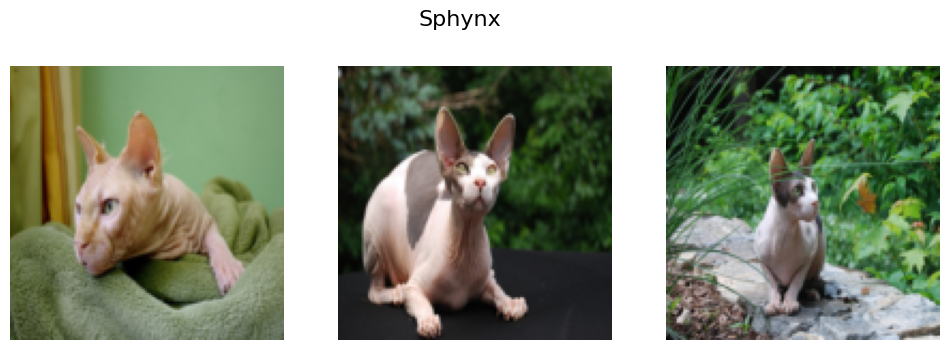

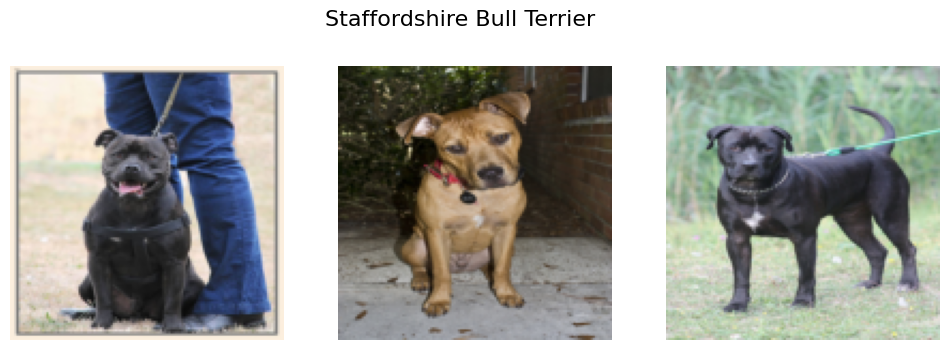

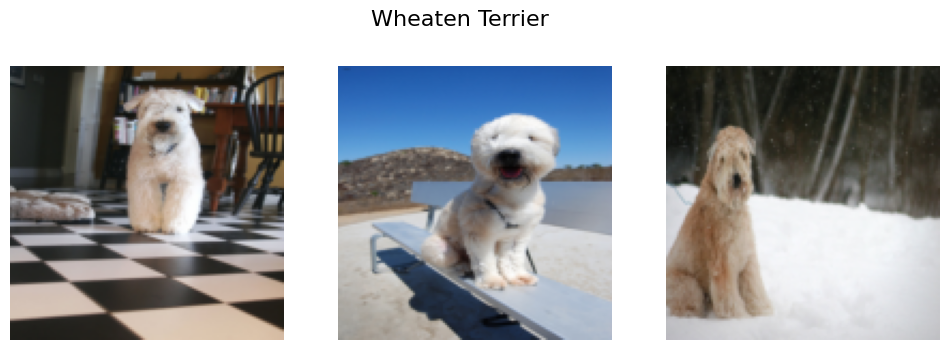

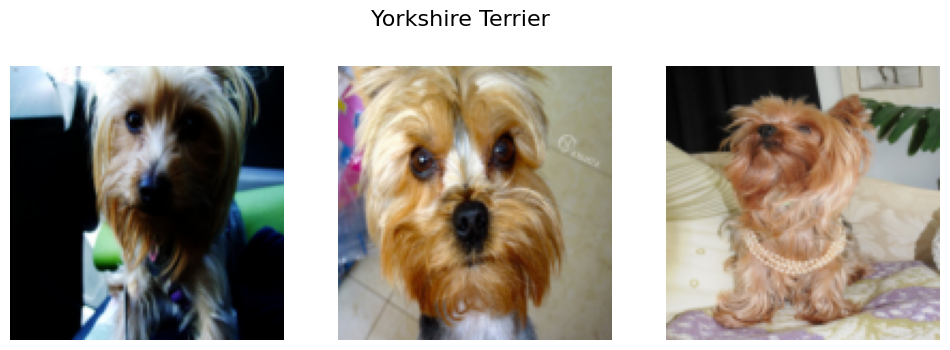

In [2]:
transform = transforms.Compose([
    transforms.Resize((128, 128)),  
    transforms.ToTensor()           
])

data_dir = './data'
train_dataset = datasets.OxfordIIITPet(root=data_dir, split='trainval', download=True, transform=transform)
test_dataset = datasets.OxfordIIITPet(root=data_dir, split='test', download=True, transform=transform)

print(f'Broj slika u train skupu: {len(train_dataset)}')
print(f'Broj slika u test skupu: {len(test_dataset)}')
print(f'Broj klasa: {len(train_dataset.classes)}')

train_labels = [label for _, label in train_dataset]
test_labels = [label for _, label in test_dataset]

train_class_counts = Counter(train_labels)
test_class_counts = Counter(test_labels)

print("\nBroj primera po klasama u train skupu:")
for i, class_name in enumerate(train_dataset.classes):
    print(f"{class_name}: {train_class_counts[i]}")

print("\nBroj primera po klasama u test skupu:")
for i, class_name in enumerate(test_dataset.classes):
    print(f"{class_name}: {test_class_counts[i]}")

def show_images_by_class(dataset, num_examples=2):
    class_indices = {class_name: [] for class_name in dataset.classes}
    
    for idx, (image, label) in enumerate(dataset):
        class_name = dataset.classes[label]
        if len(class_indices[class_name]) < num_examples:
            class_indices[class_name].append(idx)
        if all(len(indices) >= num_examples for indices in class_indices.values()):
            break

    for class_name, indices in class_indices.items():
        fig, axes = plt.subplots(1, len(indices), figsize=(12, 4))
        fig.suptitle(class_name, fontsize=16)
        for i, idx in enumerate(indices):
            img, _ = dataset[idx]
            img = img.permute(1, 2, 0) 
            axes[i].imshow(img)
            axes[i].axis('off')
        plt.show()

show_images_by_class(train_dataset, num_examples=3)

Definisanje različitih skupova transformacija, odnosno augmentacija, kako bismo videli učinak klasifikacionog modela kada ih uopšte ne koristimo, kao i kada koristimo različite skupove.

In [3]:
# Normalizacija
# normalize = transforms.Normalize((0.5, 0.5, 0.5), 
#                                  (0.5, 0.5, 0.5))

normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], 
                                 std=[0.229, 0.224, 0.225])

# Transformacija bez augmentacije
transform_no_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    normalize
])

# Transformacija sa mesavinom augmentacija
transform_mix_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    #transforms.RandomResizedCrop(224, scale=(0.9, 1.1)), # 0.8 - 1.2
    transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.1), # 0.2
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
    transforms.GaussianBlur(kernel_size=3),
    transforms.ToTensor(),
    normalize
])

# Geometrijske transformacije
transform_geom_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(15),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.2)),
    transforms.ToTensor(),
    normalize
])

# Promena osvetljenja i kontrasta
transform_color_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    transforms.ToTensor(),
    normalize
])

# Dodavanje šuma i ostale transformacije
transform_other_aug = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1)),
    transforms.RandomGrayscale(p=0.1),
    transforms.GaussianBlur(kernel_size=3),
    transforms.ToTensor(),
    normalize
])

In [4]:
def get_pet_dataloaders(transform_train, batch_size=128):
    trainset = torchvision.datasets.OxfordIIITPet(
        root='./data', split='trainval', download=True, transform=transform_train)
    
    trainloader = DataLoader(trainset, batch_size=batch_size, 
                             shuffle=True, num_workers=2)
    
    testset = torchvision.datasets.OxfordIIITPet(
        root='./data', split='test', download=True, transform=transform_no_aug)
    
    testloader = DataLoader(testset, batch_size=batch_size, 
                            shuffle=False, num_workers=2)
    
    return trainloader, testloader

# Kreiranje DataLoader-a za sve setove
dataloaders = {
    'no_aug': get_pet_dataloaders(transform_no_aug),
    'mix_aug': get_pet_dataloaders(transform_mix_aug),
    'geom_aug': get_pet_dataloaders(transform_geom_aug),
    'color_aug': get_pet_dataloaders(transform_color_aug),
    'other_aug': get_pet_dataloaders(transform_other_aug),
}

Definisanje klasifikacionog modela, kao i osnovnih metoda za treniranje i evaluaciju istog. Resnet18 model je neophodno doraditi kako bi podržao klasifikaciju na 37 klasa.

In [5]:
class ResNet18_pets(nn.Module):
    def __init__(self, num_classes=37):
        super(ResNet18_pets, self).__init__()
        self.model = models.resnet18(pretrained=True)
        num_ftrs = self.model.fc.in_features
        self.model.fc = nn.Linear(num_ftrs, num_classes)
        
    def forward(self, x):
        return self.model(x)

def train_model(model, trainloader, criterion, optimizer, epochs=20):
    model.to(device)
    model.train()
    
    for epoch in range(epochs):
        running_loss = 0.0
        correct = 0
        total = 0
        
        for inputs, labels in trainloader:
            inputs, labels = inputs.to(device), labels.to(device)
            
            optimizer.zero_grad()
            
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            
            running_loss += loss.item() * inputs.size(0)
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
        
        epoch_loss = running_loss / total
        epoch_acc = 100. * correct / total
        print(f"Epoch {epoch+1}/{epochs} - Loss: {epoch_loss:.4f} - Acc: {epoch_acc:.2f}%")
    
    return model

def evaluate_model(model, testloader):
    model.to(device)
    model.eval()
    
    correct = 0
    total = 0
    
    with torch.no_grad():
        for inputs, labels in testloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
    
    acc = 100. * correct / total
    return acc

def evaluate_model_with_metrics(model, testloader):
    model.to(device)
    model.eval()
    
    all_preds = []
    all_labels = []
    
    with torch.no_grad():
        for inputs, labels in testloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = outputs.max(1)
            
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
    
    accuracy = accuracy_score(all_labels, all_preds)
    report = classification_report(all_labels, all_preds, target_names=testloader.dataset.classes, zero_division=0)
    
    print(f"Tačnost (Accuracy): {accuracy * 100:.2f}%")
    print("Izveštaj o klasifikaciji (Precision, Recall, F1-score):\n")
    print(report)
    
    return accuracy, report

Koristimo uređaj: cuda

Treniranje ResNet18 modela sa 'no_aug' augmentacijom:


E:\Master\master\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
E:\Master\master\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/10 - Loss: 1.2143 - Acc: 67.04%
Epoch 2/10 - Loss: 0.3165 - Acc: 91.22%
Epoch 3/10 - Loss: 0.1080 - Acc: 97.93%
Epoch 4/10 - Loss: 0.0332 - Acc: 99.38%
Epoch 5/10 - Loss: 0.0217 - Acc: 99.62%
Epoch 6/10 - Loss: 0.0252 - Acc: 99.46%
Epoch 7/10 - Loss: 0.0232 - Acc: 99.59%
Epoch 8/10 - Loss: 0.0330 - Acc: 99.21%
Epoch 9/10 - Loss: 0.0691 - Acc: 98.15%
Epoch 10/10 - Loss: 0.2010 - Acc: 93.48%
Trening završen za 398.04 sekundi.
Tačnost (Accuracy): 31.62%
Izveštaj o klasifikaciji (Precision, Recall, F1-score):

                            precision    recall  f1-score   support

                Abyssinian       0.55      0.12      0.20        98
          American Bulldog       0.27      0.73      0.39       100
 American Pit Bull Terrier       0.19      0.07      0.10       100
              Basset Hound       0.11      0.62      0.19       100
                    Beagle       0.13      0.71      0.23       100
                    Bengal       0.46      0.06      0.11       100
   

E:\Master\master\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
E:\Master\master\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/10 - Loss: 1.3934 - Acc: 61.49%
Epoch 2/10 - Loss: 0.6340 - Acc: 80.19%
Epoch 3/10 - Loss: 0.3917 - Acc: 88.10%
Epoch 4/10 - Loss: 0.3506 - Acc: 88.80%
Epoch 5/10 - Loss: 0.2907 - Acc: 91.30%
Epoch 6/10 - Loss: 0.3016 - Acc: 90.46%
Epoch 7/10 - Loss: 0.2279 - Acc: 93.64%
Epoch 8/10 - Loss: 0.1756 - Acc: 94.54%
Epoch 9/10 - Loss: 0.1568 - Acc: 94.81%
Epoch 10/10 - Loss: 0.1460 - Acc: 95.54%
Trening završen za 550.36 sekundi.
Tačnost (Accuracy): 64.43%
Izveštaj o klasifikaciji (Precision, Recall, F1-score):

                            precision    recall  f1-score   support

                Abyssinian       0.74      0.79      0.76        98
          American Bulldog       0.77      0.30      0.43       100
 American Pit Bull Terrier       0.37      0.34      0.36       100
              Basset Hound       1.00      0.12      0.21       100
                    Beagle       0.81      0.29      0.43       100
                    Bengal       0.90      0.28      0.43       100
   

E:\Master\master\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
E:\Master\master\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/10 - Loss: 1.6145 - Acc: 54.38%
Epoch 2/10 - Loss: 0.8284 - Acc: 74.40%
Epoch 3/10 - Loss: 0.6451 - Acc: 79.40%
Epoch 4/10 - Loss: 0.5314 - Acc: 83.72%
Epoch 5/10 - Loss: 0.4522 - Acc: 85.49%
Epoch 6/10 - Loss: 0.3773 - Acc: 87.72%
Epoch 7/10 - Loss: 0.3156 - Acc: 89.67%
Epoch 8/10 - Loss: 0.3245 - Acc: 89.86%
Epoch 9/10 - Loss: 0.2836 - Acc: 90.79%
Epoch 10/10 - Loss: 0.2372 - Acc: 92.45%
Trening završen za 459.07 sekundi.
Tačnost (Accuracy): 61.41%
Izveštaj o klasifikaciji (Precision, Recall, F1-score):

                            precision    recall  f1-score   support

                Abyssinian       0.63      0.77      0.69        98
          American Bulldog       0.46      0.73      0.57       100
 American Pit Bull Terrier       0.41      0.49      0.45       100
              Basset Hound       0.90      0.35      0.50       100
                    Beagle       0.90      0.18      0.30       100
                    Bengal       0.75      0.58      0.66       100
   

E:\Master\master\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
E:\Master\master\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/10 - Loss: 1.2978 - Acc: 65.00%
Epoch 2/10 - Loss: 0.3903 - Acc: 88.67%
Epoch 3/10 - Loss: 0.1767 - Acc: 95.54%
Epoch 4/10 - Loss: 0.1080 - Acc: 97.15%
Epoch 5/10 - Loss: 0.0790 - Acc: 97.91%
Epoch 6/10 - Loss: 0.0534 - Acc: 98.67%
Epoch 7/10 - Loss: 0.0432 - Acc: 98.97%
Epoch 8/10 - Loss: 0.0352 - Acc: 99.13%
Epoch 9/10 - Loss: 0.0503 - Acc: 98.51%
Epoch 10/10 - Loss: 0.0507 - Acc: 98.70%
Trening završen za 811.87 sekundi.
Tačnost (Accuracy): 59.04%
Izveštaj o klasifikaciji (Precision, Recall, F1-score):

                            precision    recall  f1-score   support

                Abyssinian       0.83      0.39      0.53        98
          American Bulldog       0.59      0.48      0.53       100
 American Pit Bull Terrier       0.33      0.30      0.31       100
              Basset Hound       0.50      0.31      0.38       100
                    Beagle       0.56      0.58      0.57       100
                    Bengal       0.89      0.32      0.47       100
   

E:\Master\master\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
E:\Master\master\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/10 - Loss: 1.3759 - Acc: 62.17%
Epoch 2/10 - Loss: 0.5189 - Acc: 84.65%
Epoch 3/10 - Loss: 0.3373 - Acc: 89.78%
Epoch 4/10 - Loss: 0.2881 - Acc: 91.28%
Epoch 5/10 - Loss: 0.2511 - Acc: 92.36%
Epoch 6/10 - Loss: 0.1890 - Acc: 94.46%
Epoch 7/10 - Loss: 0.1497 - Acc: 95.62%
Epoch 8/10 - Loss: 0.1088 - Acc: 96.82%
Epoch 9/10 - Loss: 0.1284 - Acc: 96.25%
Epoch 10/10 - Loss: 0.1476 - Acc: 95.49%
Trening završen za 249.65 sekundi.
Tačnost (Accuracy): 68.74%
Izveštaj o klasifikaciji (Precision, Recall, F1-score):

                            precision    recall  f1-score   support

                Abyssinian       0.89      0.49      0.63        98
          American Bulldog       0.52      0.69      0.59       100
 American Pit Bull Terrier       0.94      0.16      0.27       100
              Basset Hound       0.68      0.61      0.64       100
                    Beagle       0.32      0.84      0.47       100
                    Bengal       0.55      0.93      0.69       100
   

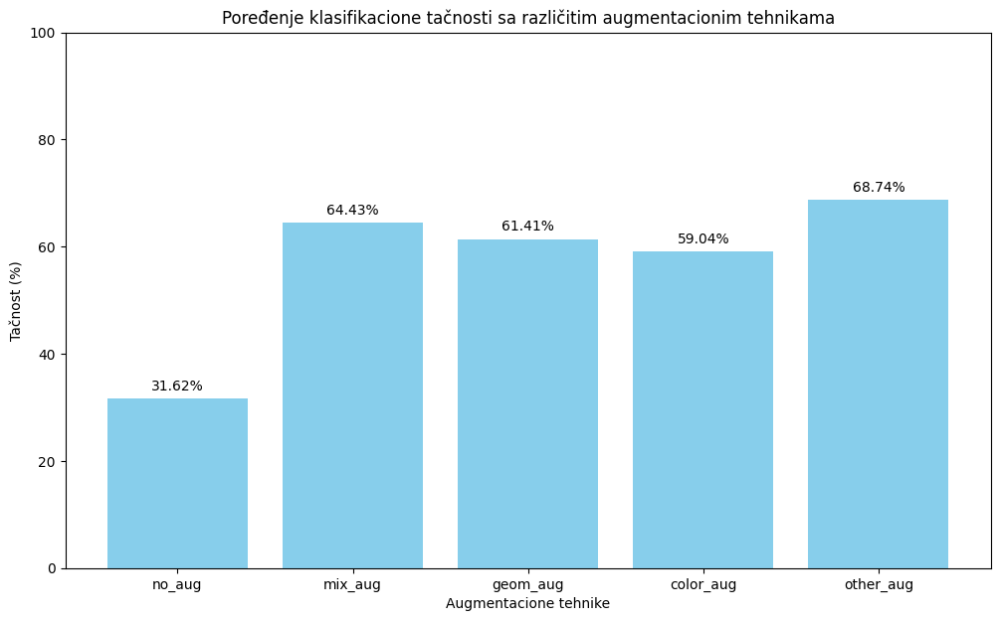

In [6]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Koristimo uređaj: {device}")

results = {}

# Definisanje hiperparametara
learning_rate = 0.001
epochs = 10

for aug_type, (trainloader, testloader) in dataloaders.items():
    print(f"\nTreniranje ResNet18 modela sa '{aug_type}' augmentacijom:")
    model = ResNet18_pets(num_classes=37)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)
    
    start_time = time.time()
    model = train_model(model, trainloader, criterion, optimizer, epochs=epochs)
    train_time = time.time() - start_time
    print(f"Trening završen za {train_time:.2f} sekundi.")
    
    test_acc, report = evaluate_model_with_metrics(model, testloader)
    print(f"Test Accuracy za '{aug_type}': {test_acc:.2f}%")
    
    results[aug_type] = test_acc * 100

# Prikaz rezultata
print("\nRezultati klasifikacije:")
for aug_type, acc in results.items():
    print(f"{aug_type}: {acc:.2f}%")

aug_types = list(results.keys())
accuracies = list(results.values())

plt.figure(figsize=(12, 7))
bars = plt.bar(aug_types, accuracies, color='skyblue')
plt.xlabel('Augmentacione tehnike')
plt.ylabel('Tačnost (%)')
plt.title('Poređenje klasifikacione tačnosti sa različitim augmentacionim tehnikama')
plt.ylim(0, 100)

for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height + 1, f'{height:.2f}%', ha='center', va='bottom')

plt.show()

Kao što možemo videti, u cilju pokazivanja principa korišćenja augmentacije slika, nije nam bilo od presudnog značaja da modele koje smo trenirali dovedemo do savršenstva, već da se pokaže da korišćenjem augmentacije slika možemo poboljšati model. U ovom slučaju su korišćeni različiti podskupovi augmentacionih transformacija i svaki je doprineo poboljšanju metrika na klasifikacionom zadatku.